# Evaluating Candidate Stars for Exoplanets

## Souji Duggirala, Katie Wah, Karthik Yadavalli, Diego Granizo

## Introduction

### Motivation & Problem

Just like the Earth orbits the sun, there are planets that orbit other stars in the universe. Only recently have we been able to build telescopes and satellites sensitive enough to detect the planets that orbit these stars. When we look at such a planet, we also measure the properties of the star that it orbits. Specifically, our telescopes can measure the amounts of different elements that exist inside the star. Using a database that lists over 6000 stars’ properties, our project will attempt to find any relationship between the characteristics of a star and how likely the star is to host a planet. In essence, this project will attempt to answer the question: “Given a star and its observed properties, how likely is it to host a planet?”

Using the <a href="https://www.hypatiacatalog.com/hypatia/default/launch?mode=hist">Hypatia Catalog</a>, a publicly available dataset, we aim to cluster stars in “spectral space”, a high-dimensional space, where the dimensions include astronomical coordinates, mass, brightness, and element abundance. We aim to compare our clustering with current classification of spectral class and with these clusters calculate the probability that a star falls into any of the clusters. Given this information and the prevalence of exoplanets in each star, we will be able to better predict which stars are viable candidates for exoplanets.

### What People Have Already Done

One of the major forefronts in astrophysics today is the hunt for exoplanets. Pioneered by Kepler and now the James Webb Telescope, we have increased our capabilities; nevertheless, we are limited in what we can observe. As of today, scientists predict whether a star has an exoplanet through various methods by observing a stars brightness, radial velocity, microlensing etc; this is known as transit photometry. Despite the leaps and bounds that have allowed us to track more than 3,500 exoplanets there are a limits to our current practice. One of them is that there is a lot of “noise”, which is something that gets in the way of our perception of this star, such as dust clouds and asteroids. So far, much of the previous work has been in using machine learning models to do noise reduction and other such analysis on exoplanet transit data in order to increase the reliability of detection. However, not much is known about how a star’s spectrum and its composition predict the existence of exoplanets. This project will facilitate screening of stars when searching for exoplanets.

### The Dataset

#### Hypatia Catalog

We initially got the data from the publicly available hypatia catalog which currently tracks about 6000 stars within 150 pc of the sun compiled over multiple pieces of scientific literature. In this data set, there is information on the stars’ composition and other important characteristics. Stars are classified by spectral type based on their atmospheric temperature and luminosity, and are notated with the letters O, B, K, F, G, K, M where O stars are the biggest and hottest and M stars are the coldest and smallest. There are 7 different spectral types for stars, but it is known that generally only F, G, and K stars are host planets. And for the data set from Hypatia, the included stars were of spectral types F, G, K, M.

#### Preparing the Data

After finding this data set, we looked through the data set and cleaned it accordingly. We looked at the non-numerical data and assessed whether it was useful to our project and would drive the results. If we concluded that non-numerical data was useful, we would change it into numerical data based on critically evaluating the range of values that the data can take. If we found that the non-numerical data would not be beneficial to the work of our project, then that data was scrapped. Also, throughout the data set, there were some values that were missing. In order still be able to work with that data point, we filled in the missing entries with the existing mean of that specific feature for the entire data set.

## The Model

### Setting up the Environment

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import plotly
import plotly.plotly as py
import plotly.offline as pyoff
import plotly.graph_objs as go

plotly.offline.init_notebook_mode(connected=True)

from sklearn.mixture import GaussianMixture as GMM
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA as PCA
from sklearn import metrics

### Accessing the Data

In [2]:
star_data = pd.read_csv("data/Hypatia Data Final.csv")
star_data = star_data.fillna(star_data.mean()) # Filling missing values with column means

spectral_class = star_data["f_spec"]
exohost = star_data["f_name_class"]

feature_list = ['Fe', 'C', 'O', 'Mg', 'Si', 'Ca', 'Ti', 'S', 'f_ra', 'f_dec', 'f_x',
       'f_y', 'f_z', 'f_dist', 'f_disk_num', 'f_spec', 'f_spec_num', 'f_vmag',
       'f_bv', 'f_u', 'f_v', 'f_w', 'f_teff', 'f_logg', 'f_name_class']

reduced_list = ['Fe', 'C', 'O', 'Mg', 'Si', 'Ca', 'Ti', 'S', 'f_ra', 'f_dec', 'f_x',
       'f_y', 'f_z', 'f_disk_num', 'f_spec_num', 'f_vmag',
       'f_bv', 'f_u', 'f_v', 'f_w', 'f_teff', 'f_logg']

X = star_data[reduced_list]

### 2D Visualizations

There are 26 features in this dataset, and we wanted to visualize how each feature was correlated to the other with the ground truth spectral class labeling.

/Users/DJ/miniconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:488: RuntimeWarning:

invalid value encountered in true_divide

/Users/DJ/miniconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning:

invalid value encountered in double_scalars



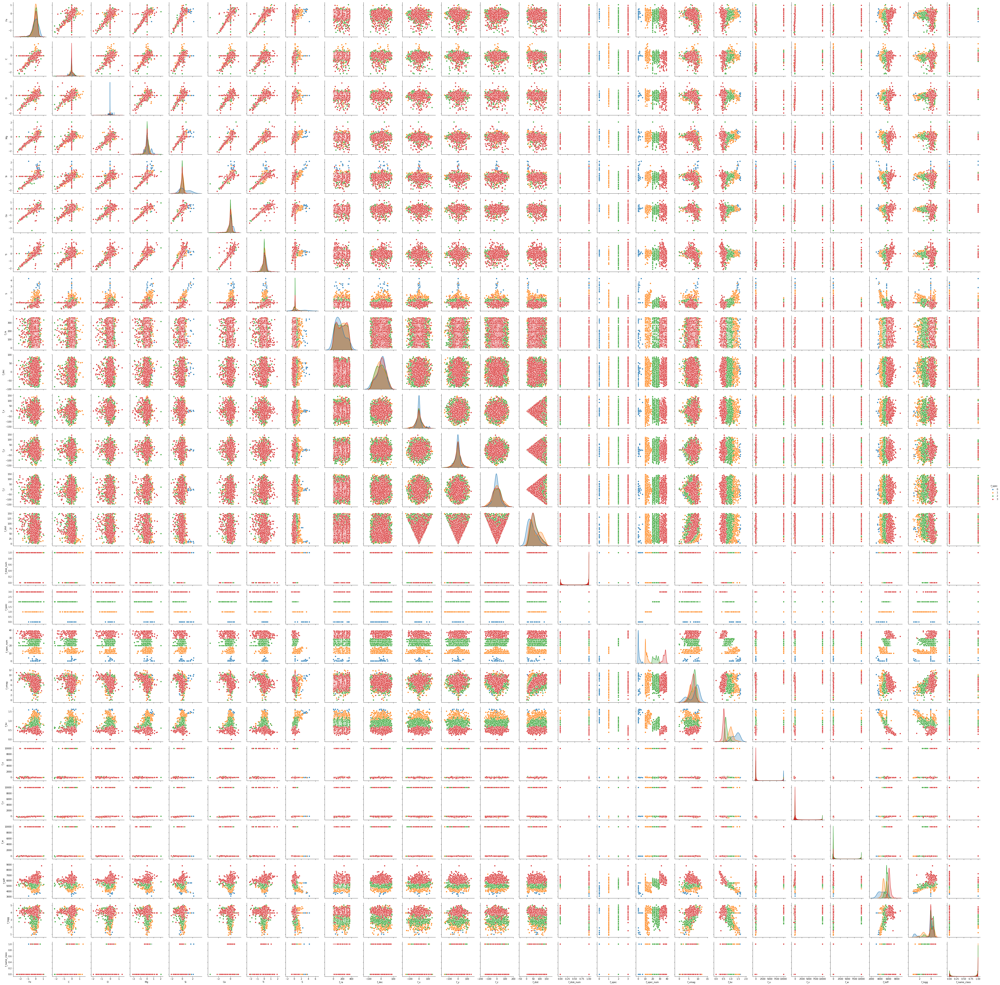

In [3]:
sns.pairplot(star_data, hue="f_spec")
#plt.savefig('pairplot.png')
plt.show()

### GMM

Initially, we ran the GMM model with 4 clusters, as we had 4 spectral classes in the dataset that hosted planets. We extracted the cluster weights (or the probability of a star being in each cluster) and the cluster assignments (or what cluster each star was put into by the model).

In [4]:
""" Normalize data for analysis"""

X_norm = (X - X.min())/(X.max() - X.min())

In [5]:
"""Evaluate GMM at each star and assign each star to the 
cluster that it has the highest probability of belonging to""" 

num_cluster = 4

gmm = GMM(n_components=num_cluster) #4 clusters: F, G, K, and M
gmm.fit(X)

cluster_means = gmm.means_
cluster_weights_ = gmm.weights_
cluster_covariance = gmm.covariances_

cluster_assignment = gmm.fit_predict(X)
probabilities = gmm.predict_proba(X)

### PCA Visualizations

The dataset we have is 26 "dimensions" as it has 26 features. This is impossible to visualize in its current state, so we had to perform a dimensionality reduction to reduce the data to 2 or 3 dimensions in order to visualize it. We used Principal Component Analysis for dimensionality reduction. After executing the PCA, we labeled the ground truth in 2 and 3 dimensions and then looked at the clustering visualization in 3 dimensions (basically changing the color of each point to match its cluster assignment).

#### Ground Truth labeling (Spectral Class)

In [6]:
pca = PCA(n_components=3)

transformed3d = pd.DataFrame(pca.fit_transform(X_norm))

plotly.tools.set_credentials_file(username='djhail', api_key='Ms09Pkg3VxZplARjGM0b')

trace1 = go.Scatter3d(
    x=transformed3d[0],
    y=transformed3d[1],
    z=transformed3d[2],
    mode='markers',
    marker=dict(
        size=10,
        color=X["f_spec_num"],  # set color to an array/list of desired values
        colorscale='Portland',   # choose a colorscale
        opacity=0.5
    )
)

data = [trace1]
layout = go.Layout(
    title=go.layout.Title(
        text='Ground Truth - Spectral Class',
        xref='paper',
        x=0
    ),
    margin=dict(
        l=0,
        r=0,
        b=0,
        t=0
    )
)
fig = go.Figure(data=data, layout=layout)
py.plot(fig, filename='Ground Truth',auto_open=False)
pyoff.iplot(fig, filename='Ground Truth')

The ground truth labeling can be found <a href="https://plot.ly/~djhail/2">here</a>.

In [7]:
trace1 = go.Scatter3d(
    x=transformed3d[0][star_data["f_name_class"]==1],
    y=transformed3d[1][star_data["f_name_class"]==1],
    z=transformed3d[2][star_data["f_name_class"]==1],
    mode='markers',
    marker=dict(
        size=5,
        color=star_data["f_name_class"]==1,  # set color to an array/list of desired values
        colorscale='Portland',   # choose a colorscale
        opacity=0.8
    )
)

data = [trace1]
layout = go.Layout(
    title=go.layout.Title(
        text='Exoplanet Hosts',
        xref='paper',
        x=0
    ),
    margin=dict(
        l=0,
        r=0,
        b=0,
        t=0
    )
)
fig = go.Figure(data=data, layout=layout)
py.plot(fig, filename='Exohosts',auto_open=False)
pyoff.iplot(fig, filename='Exohosts')

#### GMM Assignment Labeling

In [8]:
trace1 = go.Scatter3d(
    x=transformed3d[0],
    y=transformed3d[1],
    z=transformed3d[2],
    mode='markers',
    marker=dict(
        size=10,
        color=cluster_assignment,                # set color to an array/list of desired values
        colorscale='Portland',   # choose a colorscale
        opacity=0.5
    )
)

data = [trace1]
layout = go.Layout(
    title=go.layout.Title(
        text='GMM Assignment',
        xref='paper',
        x=0
    ),
    margin=dict(
        l=0,
        r=0,
        b=0,
        t=0
    )
)
fig = go.Figure(data=data, layout=layout)
py.plot(fig, filename='GMM Assignment', auto_open=False)
pyoff.iplot(fig, filename='GMM Assignment')

The assignment labeling can be found <a href="https://plot.ly/~djhail/4">here</a>.

### Comparing Clustering with Spectral Class

How well do the 4 clusters we have from running GMM compare with the ground truth spectral classes?

In [9]:
host_prob = np.zeros(num_cluster)
for i in range(num_cluster):
    num_hosts = star_data[cluster_assignment == i]["f_name_class"].sum()
    total_stars = cluster_assignment[cluster_assignment == i].size
    host_prob[i] = num_hosts / total_stars

normal_prob = np.zeros(num_cluster)
for i in range(num_cluster):
    num_host = star_data[spectral_class == i]["f_name_class"].sum()
    total_stars = spectral_class[spectral_class == i].size
    normal_prob[i] = num_host / total_stars

print(host_prob)
print(normal_prob)

[0.07581574 0.01419558 0.02222222 0.07492447]
[0.05714286 0.06655192 0.06259981 0.03849238]


In [10]:
def purity_score(y_true, y_pred):
  # compute contingency matrix (also called confusion matrix)
  contingency_matrix = metrics.cluster.contingency_matrix(y_true, y_pred)
  # return purity
  return np.sum(np.amax(contingency_matrix, axis=0)) / np.sum(contingency_matrix)

purity_score(spectral_class, cluster_assignment)

0.5675763482781027

We have a purity of about 69% with the 4 clusters.

### Determine the Best Clustering

In our initial analysis, we used only 4 clusters to signify the 4 spectral classes in the dataset. However, is there a more specific type of star that has a higher chance of having a planet?

Using the GMM output, we calculated host probabilities for each cluster and took the maximum. In essence, we looked at the probability that a star in each cluster will have a planet and took the maximum of all of the clusters. We wanted to maximize the maximum of the host probabilities for all the clusters, so this was the optimization objective.

In [11]:
def find_prob(num_cluster, cluster_assignment):
    host_prob = np.zeros(num_cluster)
    for i in range(num_cluster):
        num_stars = star_data[cluster_assignment == i]["f_name_class"].sum()
        total_stars = cluster_assignment[cluster_assignment == i].size
        host_prob[i] = num_stars / total_stars
    
    return host_prob

def compute_cluster_assignment(X, num_cluster):
    gmm = GMM(n_components=num_cluster) #4 clusters: F, G, K, and M
    gmm.fit(X)

    cluster_assignment = gmm.fit_predict(X)
    
    return gmm, cluster_assignment

def maximize_prob(X, min_iter=4, max_iter=20):
    probs = pd.Series(np.zeros(max_iter - min_iter + 1), index=range(min_iter,max_iter + 1))
    best_model = None
    for i in range(min_iter, max_iter + 1):
        model, cluster_assignment = compute_cluster_assignment(X, i)
        probs[i] = find_prob(i, cluster_assignment).max()
        if probs[i] >= probs.max():
            best_model = model
        
    return best_model, probs

In [12]:
best_model, max_probs = maximize_prob(X)

In [13]:
trace = go.Scatter(
    x = max_probs.index,
    y = max_probs
)

layout = go.Layout(
    title=go.layout.Title(
        text='Maximum Probability vs Number of Clusters',
        xref='paper',
        x=0),
    xaxis = dict(title = 'Number of Clusters'),
    yaxis = dict(title = 'Maximum Probability'),
)

fig = go.Figure(data=[trace], layout=layout)

py.plot(fig, filename='Maximum Probability vs Number of Clusters',auto_open=False)
pyoff.iplot(fig, filename='Maximum Probability vs Number of Clusters')

In [18]:
best_assignment = best_model.fit_predict(X)
best_cluster = find_prob(best_assignment.max() + 1, best_assignment).argmax()
ideal_star = pd.Series(best_model.means_[best_cluster],index=reduced_list)
ideal_composition = ideal_star[["Fe","C","O","Mg","Si","Ca","Ti","S","f_x","f_y","f_z"]]

In [19]:
sun_dict = {
"Fe" :  0.0,
"C" :  0.0,
"O" :  0.0,
"Mg" :  0.0,
"Si" :  0.0,
"Ca" :  0.0,
"Ti" :  0.0,
"S" :  0.0,
"f_ra" :  0.0,
"f_dec" :  0.0,
"f_x" :  0.0,
"f_y" :  0.0,
"f_z" :  0.0,
"f_disk_num" :  0.9999999999999999,
"f_spec_num" :  11.834634162807342,
"f_vmag" :  0.0,
"f_bv" :  0.656,
"f_u" :  0.0,
"f_v" :  0.0,
"f_w" :  0.0,
"f_teff" :  5777.0,
"f_logg" :  3.44746813095,
}
sun_data = pd.Series(sun_dict)

In [20]:
trace1 = go.Bar(
    x=ideal_composition,      
    y=ideal_composition.index,
    orientation='h',
    marker=dict(
        color=[5,5,5,5,5,5,5,5,1,1,1],
        colorscale='Portland', 
        opacity=0.5
    )
)

layout = go.Layout(
    barmode='group',
    xaxis = dict(title = 'Measurements relative to our Sun'),
    title=go.layout.Title(
        text='Cluster Comparison',
        xref='paper',
        x=0
    )
)

fig = go.Figure(data=[trace1], layout=layout)
py.plot(fig, filename='Cluster Comparison', auto_open=False)
pyoff.iplot(fig, filename='Cluster Comparison')

By looking at the objective value for the number of clusters from 1 to 10, we found that the objective was maximized when the number of clusters is 14. In essence, with 4 clusters, the maximum of all the host probability was about 10% but with 14 clusters, the maximum was 20%, so we decided to cluster the stars into 14 clusters.

## Random Forest Classifier

In [21]:
X_train, X_test, y_train, y_test = train_test_split(X, exohost, test_size=0.3)

clf=RandomForestClassifier(n_estimators=100)
clf.fit(X_train,y_train)

y_pred=clf.predict(X_test)

feature_imp = pd.Series(clf.feature_importances_,index=X.columns).sort_values(ascending=True)

print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.9501894964807797


In [22]:
trace = go.Bar(
    x=feature_imp,      
    y=feature_imp.index,
    orientation='h',
    marker=dict(
        color=feature_imp,
        colorscale='Portland', 
        opacity=0.5
    )
)

layout = go.Layout(    
        title=go.layout.Title(
            text='Feature Importance',
            xref='paper',
            x=0
    )
)

fig = go.Figure(data=[trace], layout=layout)
py.plot(fig, filename='Feature Importance', auto_open=False)
pyoff.iplot(fig, filename='Feature Importance')

## Conclusion

### Major Achievement

From the GMM algorithm, we were able to get the distribution of the characteristics for each cluster. For example, we know that for a certain cluster of stars, the elemental composition follows a certain distribution. In the future, when looking for exoplanets, astronomers can look for stars that have elemental composition that follows the distribution of the clusters with the highest host probabilities.

This leads to the second major achievement of the project, which are the clusters' host probabilities. This is the variable that we were looking to maximize when choosing the number of clusters. A cluster's host probability is the probability that a star in a specific cluster hosts an exoplanet. We were able to conduct an additional analysis on the output from the GMM to calculate host probabilities for each cluster.

Then, with the cluster with the highest host probability, we were able to extract the means for the different characteristics for the cluster most likely to host a planet. When we checked the means of the stellar elemental composition for the cluster most likely to host a planet, we saw that the they closely matched that of the Sun, which was an interesting find.

### Future Work

In the future, any additional analysis to be done would require more star data. This way, we can fit our model to a bigger dataset to see if it holds for a larger sample.

The application of our model is for astronomers who want to look for a planet in the future. They can look for stars that have similar characteristics to stars in the cluster with the highest probability of hosting a planet.

## References

Fakhouri, O. (n.d.). Exoplanet Orbit Database | Exoplanet Data Explorer. Retrieved February 20, 2019, from http://exoplanets.org/

The Planetary Society. (2019). Transit Photometry. Retrieved February 20, 2019, from http://www.planetary.org/explore/space-topics/exoplanets/transit-photometry.html

Vanderbilt University. (2019). Hypatia Catalog Database. Retrieved February 20, 2019, from https://www.hypatiacatalog.com/hypatia